In [2]:
# load data from a txt file after skipping 30 lines and true header and using ";" as separator
import pandas as pd
data = pd.read_csv("/Users/probio/Downloads/offwrist-detection/20240610_data/Test01_wrist.txt", sep=";", skiprows=30, header=0)

In [3]:
# print the first 5 rows of the data
print(data.head())

             DATE/TIME  MS  EVENT  TEMPERATURE  EXT TEMPERATURE  ORIENTATION   
0  11/01/2024 11:17:39   0      0        22.50              0.0           16  \
1  11/01/2024 11:18:39   0      0        24.06              0.0            8   
2  11/01/2024 11:19:39   0      0        24.69              0.0           16   
3  11/01/2024 11:20:39   0      0        25.12              0.0            8   
4  11/01/2024 11:21:39   0      0        25.31              0.0           16   

    PIM     PIMn  TAT      TATn  ...      F1      F2      F3      F4      F5   
0  5964  99.4000  193  3.216670  ...  0.0078  0.0153  0.0195  0.0268  0.0412  \
1  2288  38.1333   68  1.133330  ...  0.0231  0.0423  0.0567  0.0776  0.0956   
2  2600  43.3333   52  0.866667  ...  0.0206  0.0383  0.0513  0.0706  0.0947   
3  2543  42.3833   42  0.700000  ...  0.0195  0.0361  0.0486  0.0669  0.0841   
4  1170  19.5000   14  0.233333  ...  0.0191  0.0358  0.0472  0.0646  0.0873   

       F6      F7      F8  MELANOPIC E

In [4]:
# print the shape of the data
print(data.shape)

(11734, 33)


In [5]:
# remove columns with all values as zero
data = data.loc[:, (data != 0).any(axis=0)]
# print the shape of the data
print(data.shape)

(11734, 25)


In [6]:
# make column name pythonic
data.columns = data.columns.str.replace(' ', '_')
data.columns = data.columns.str.replace('/', '_')
# make them lowercase
data.columns = data.columns.str.lower()
print(data.columns)

Index(['date_time', 'event', 'temperature', 'orientation', 'pim', 'pimn',
       'tat', 'tatn', 'zcm', 'zcmn', 'light', 'ir_light', 'state',
       'cap_sens_1', 'cap_sens_2', 'f1', 'f2', 'f3', 'f4', 'f5', 'f6', 'f7',
       'f8', 'melanopic_edi', 'clear'],
      dtype='object')


In [7]:
# convert date_time to datetime
data['date_time'] = pd.to_datetime(data['date_time'], format='%d/%m/%Y %H:%M:%S')

In [8]:
# Convert the 'DATE/TIME' column to month, day, and hour columns
#df['month'] = df['DATE/TIME'].dt.month
data['day'] = data['date_time'].dt.day
data['hour'] = data['date_time'].dt.hour

In [9]:
# identifing data types
data.dtypes

date_time        datetime64[ns]
event                     int64
temperature             float64
orientation               int64
pim                       int64
pimn                    float64
tat                       int64
tatn                    float64
zcm                       int64
zcmn                    float64
light                   float64
ir_light                float64
state                     int64
cap_sens_1                int64
cap_sens_2                int64
f1                      float64
f2                      float64
f3                      float64
f4                      float64
f5                      float64
f6                      float64
f7                      float64
f8                      float64
melanopic_edi           float64
clear                   float64
day                       int32
hour                      int32
dtype: object

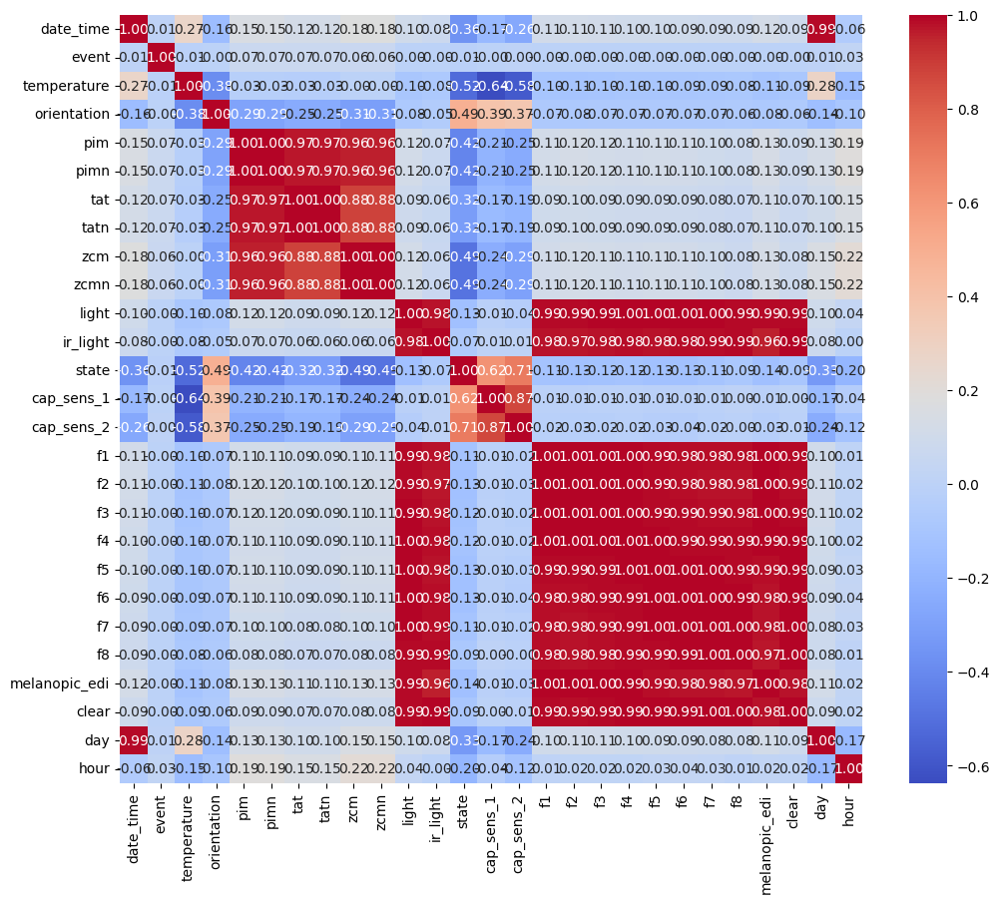

In [10]:
# calculate correlation matrix
corr = data.corr()
#corr.style.background_gradient(cmap='coolwarm')

# heatmap using seaborn with correlation matrix
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 10))
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt=".2f")
plt.show()

In [11]:
# drop columns with name 'pimn', 'tatn', 'zcmn'
data = data.drop(['pimn', 'tatn', 'zcmn'], axis=1)

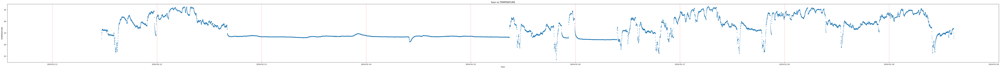

In [12]:
# Extract unique days
unique_days = data['date_time'].dt.floor('d').unique()

plt.figure(figsize=(100, 6))
plt.scatter(data['date_time'], data['temperature'], s=10, alpha=0.5)

# Add vertical dashed lines for each unique day
for day in unique_days:
    plt.axvline(day, color='r', linestyle='--', linewidth=0.5)

plt.xlabel('hour')
plt.ylabel('TEMPERATURE')
plt.title('hour vs TEMPERATURE')
plt.show()

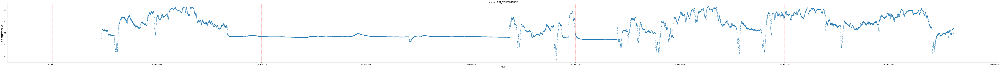

In [13]:
# Extract unique days
unique_days = data['date_time'].dt.floor('d').unique()

plt.figure(figsize=(100, 6))
plt.scatter(data['date_time'], data['temperature'], s=10, alpha=0.5)

# Add vertical dashed lines for each unique day
for day in unique_days:
    plt.axvline(day, color='r', linestyle='--', linewidth=0.5)

plt.xlabel('hour')
plt.ylabel('EXT_TEMPERATURE')
plt.title('hour vs EXT_TEMPERATURE')
plt.show()

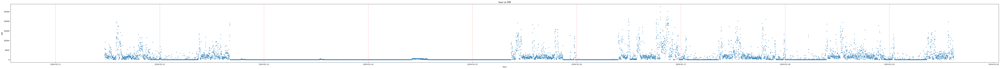

In [14]:
# Extract unique days
unique_days = data['date_time'].dt.floor('d').unique()

plt.figure(figsize=(100, 6))
plt.scatter(data['date_time'], data['pim'], s=10, alpha=0.5)

# Add vertical dashed lines for each unique day
for day in unique_days:
    plt.axvline(day, color='r', linestyle='--', linewidth=0.5)

plt.xlabel('hour')
plt.ylabel('PIM')
plt.title('hour vs PIM')
plt.show()

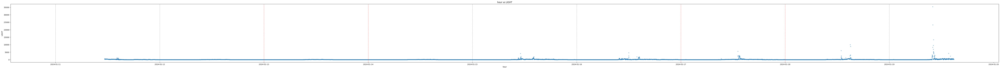

In [15]:
# Extract unique days
unique_days = data['date_time'].dt.floor('d').unique()

plt.figure(figsize=(100, 6))
plt.scatter(data['date_time'], data['light'], s=10, alpha=0.5)

# Add vertical dashed lines for each unique day
for day in unique_days:
    plt.axvline(day, color='r', linestyle='--', linewidth=0.5)

plt.xlabel('hour')
plt.ylabel('LIGHT')
plt.title('hour vs LIGHT')
plt.show()

## Plot per day

In [16]:
# Identifing initial and end date of recode
print(data['date_time'].min())
print(data['date_time'].max())

2024-01-11 11:17:39
2024-01-19 14:50:39


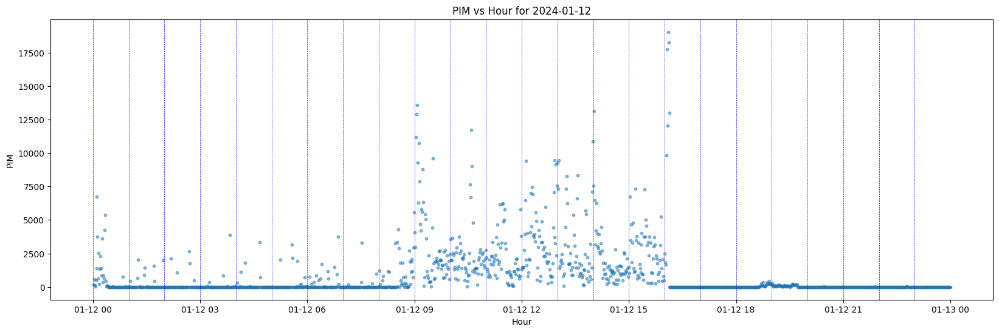

In [17]:
def plot_day(df, day):
    # Filter data for the specified day
    day_start = pd.Timestamp(day)
    day_end = day_start + pd.Timedelta(days=1)
    day_data = df[(df['date_time'] >= day_start) & (df['date_time'] < day_end)]

    # Extract unique hours
    unique_hours = day_data['date_time'].dt.floor('H').unique()

    plt.figure(figsize=(20, 6))
    plt.scatter(day_data['date_time'], day_data['pim'], s=10, alpha=0.5)

    # Add vertical dashed lines for each unique hour
    for hour in unique_hours:
        plt.axvline(hour, color='b', linestyle='--', linewidth=0.5)

    plt.xlabel('Hour')
    plt.ylabel('PIM')
    plt.title(f'PIM vs Hour for {day}')
    plt.show()

# Example usage
plot_day(data, '2024-01-12')

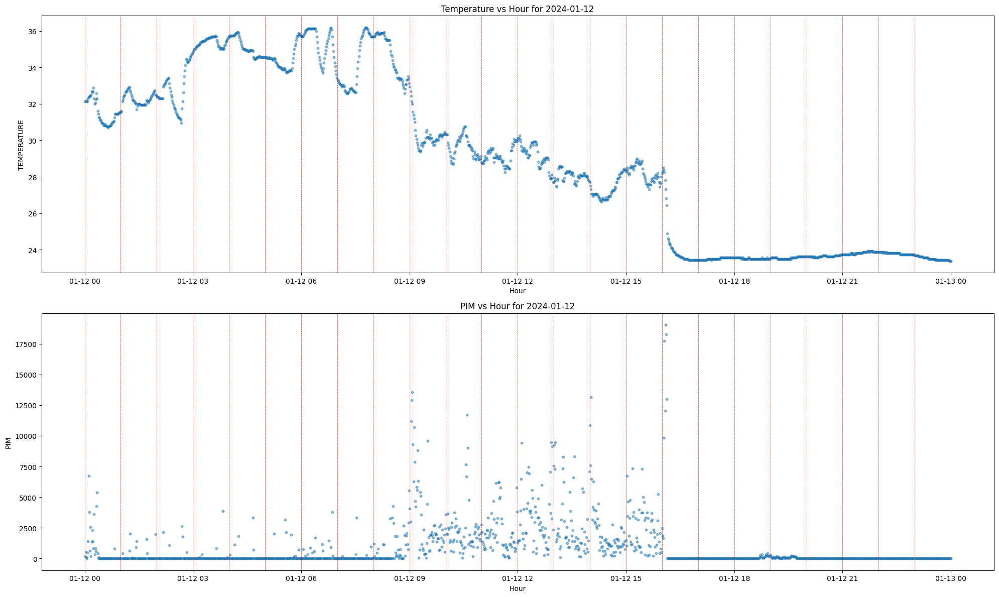

In [18]:
def plot_day(df, day):
    # Filter data for the specified day
    day_start = pd.Timestamp(day)
    day_end = day_start + pd.Timedelta(days=1)
    day_data = df[(df['date_time'] >= day_start) & (df['date_time'] < day_end)]

    # Extract unique hours
    unique_hours = day_data['date_time'].dt.floor('H').unique()

    fig, axs = plt.subplots(2, 1, figsize=(20, 12))

    # Plot TEMPERATURE
    axs[0].scatter(day_data['date_time'], day_data['temperature'], s=10, alpha=0.5)
    axs[0].set_xlabel('Hour')
    axs[0].set_ylabel('TEMPERATURE')
    axs[0].set_title(f'Temperature vs Hour for {day}')
    for hour in unique_hours:
        axs[0].axvline(hour, color='r', linestyle='--', linewidth=0.5)

    # Plot PIM
    axs[1].scatter(day_data['date_time'], day_data['pim'], s=10, alpha=0.5)
    axs[1].set_xlabel('Hour')
    axs[1].set_ylabel('PIM')
    axs[1].set_title(f'PIM vs Hour for {day}')
    for hour in unique_hours:
        axs[1].axvline(hour, color='r', linestyle='--', linewidth=0.5)

    plt.tight_layout()
    plt.show()

# Example usage
plot_day(data, '2024-01-12')


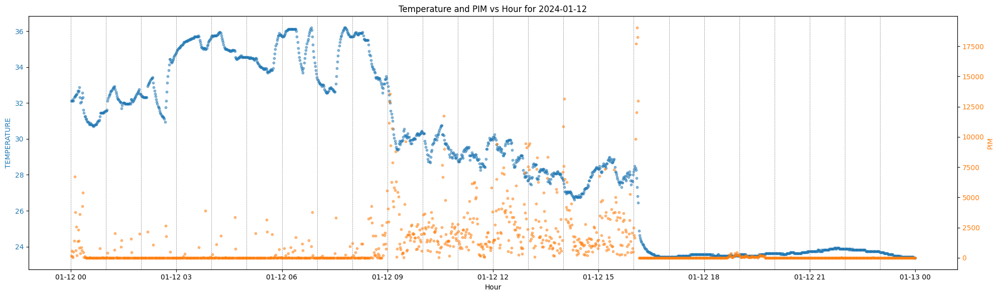

In [19]:
def plot_day(df, day):
    # Filter data for the specified day
    day_start = pd.Timestamp(day)
    day_end = day_start + pd.Timedelta(days=1)
    day_data = df[(df['date_time'] >= day_start) & (df['date_time'] < day_end)]

    # Extract unique hours
    unique_hours = day_data['date_time'].dt.floor('H').unique()

    fig, ax1 = plt.subplots(figsize=(20, 6))

    color = 'tab:blue'
    ax1.set_xlabel('Hour')
    ax1.set_ylabel('TEMPERATURE', color=color)
    ax1.scatter(day_data['date_time'], day_data['temperature'], s=10, alpha=0.5, color=color)
    ax1.tick_params(axis='y', labelcolor=color)
    ax1.set_title(f'Temperature and PIM vs Hour for {day}')
    for hour in unique_hours:
        ax1.axvline(hour, color='gray', linestyle='--', linewidth=0.5)

    ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

    color = 'tab:orange'
    ax2.set_ylabel('PIM', color=color)  # we already handled the x-label with ax1
    ax2.scatter(day_data['date_time'], day_data['pim'], s=10, alpha=0.5, color=color)
    ax2.tick_params(axis='y', labelcolor=color)

    fig.tight_layout()  # otherwise the right y-label is slightly clipped
    plt.show()

# Example usage
plot_day(data, '2024-01-12')


## Overlaying three variables

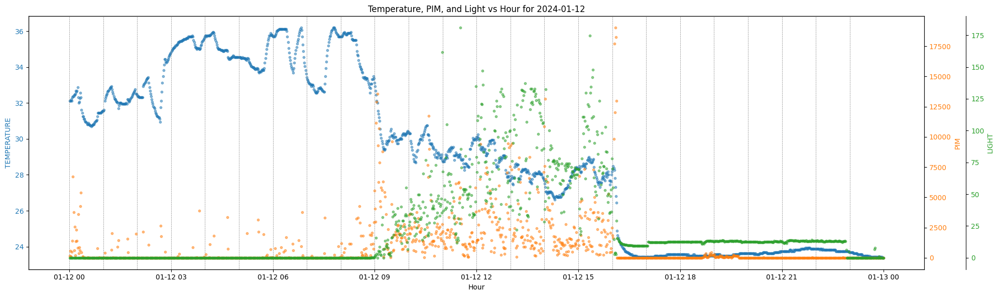

In [20]:
def plot_day(df, day):
    # Filter data for the specified day
    day_start = pd.Timestamp(day)
    day_end = day_start + pd.Timedelta(days=1)
    day_data = df[(df['date_time'] >= day_start) & (df['date_time'] < day_end)]

    # Extract unique hours
    unique_hours = day_data['date_time'].dt.floor('H').unique()

    fig, ax1 = plt.subplots(figsize=(20, 6))

    color1 = 'tab:blue'
    ax1.set_xlabel('Hour')
    ax1.set_ylabel('TEMPERATURE', color=color1)
    ax1.scatter(day_data['date_time'], day_data['temperature'], s=10, alpha=0.5, color=color1)
    ax1.tick_params(axis='y', labelcolor=color1)
    ax1.set_title(f'Temperature, PIM, and Light vs Hour for {day}')
    for hour in unique_hours:
        ax1.axvline(hour, color='gray', linestyle='--', linewidth=0.5)

    ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
    color2 = 'tab:orange'
    ax2.set_ylabel('PIM', color=color2)
    ax2.scatter(day_data['date_time'], day_data['pim'], s=10, alpha=0.5, color=color2)
    ax2.tick_params(axis='y', labelcolor=color2)

    # Create a third y-axis for LIGHT
    ax3 = ax1.twinx()  # instantiate another axes that shares the same x-axis
    ax3.spines['right'].set_position(('outward', 60))  # move the spine outward by 60 points
    color3 = 'tab:green'
    ax3.set_ylabel('LIGHT', color=color3)
    ax3.scatter(day_data['date_time'], day_data['light'], s=10, alpha=0.5, color=color3)
    ax3.tick_params(axis='y', labelcolor=color3)

    fig.tight_layout()  # otherwise the right y-label is slightly clipped
    plt.show()

# Example usage
plot_day(data, '2024-01-12')


## Scaled version

/var/folders/3t/mc9hl21152s0c3y6qfpzl90c0000gn/T/ipykernel_10026/2032154960.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  day_data['temperature'] = (day_data['temperature'] - temp_min) / (temp_max - temp_min)
/var/folders/3t/mc9hl21152s0c3y6qfpzl90c0000gn/T/ipykernel_10026/2032154960.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  day_data['pim'] = (day_data['pim'] - pim_min) / (pim_max - pim_min)
/var/folders/3t/mc9hl21152s0c3y6qfpzl90c0000gn/T/ipykernel_10026/2032154960.py:18: SettingWithCopyW

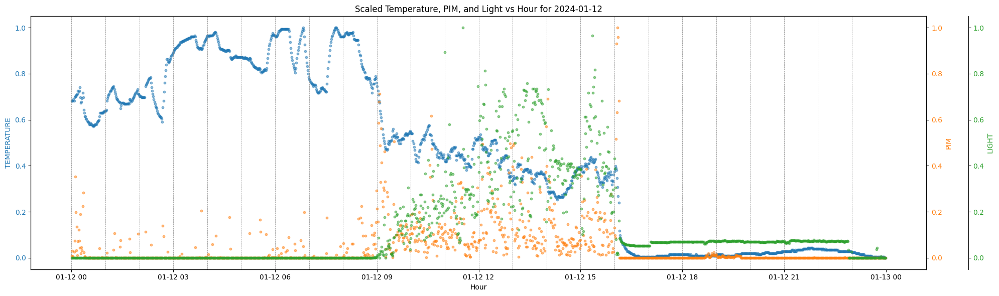

In [21]:

def plot_day(df, day, scale='normalize'):
    # Filter data for the specified day
    day_start = pd.Timestamp(day)
    day_end = day_start + pd.Timedelta(days=1)
    day_data = df[(df['date_time'] >= day_start) & (df['date_time'] < day_end)]

    # Extract unique hours
    unique_hours = day_data['date_time'].dt.floor('H').unique()

    # Scale data
    if scale == 'normalize':
        temp_max, temp_min = day_data['temperature'].max(), day_data['temperature'].min()
        pim_max, pim_min = day_data['pim'].max(), day_data['pim'].min()
        light_max, light_min = day_data['light'].max(), day_data['light'].min()
        
        day_data['temperature'] = (day_data['temperature'] - temp_min) / (temp_max - temp_min)
        day_data['pim'] = (day_data['pim'] - pim_min) / (pim_max - pim_min)
        day_data['light'] = (day_data['light'] - light_min) / (light_max - light_min)
    elif scale == 'standardize':
        temp_mean, temp_std = day_data['temperature'].mean(), day_data['temperature'].std()
        pim_mean, pim_std = day_data['pim'].mean(), day_data['pim'].std()
        light_mean, light_std = day_data['light'].mean(), day_data['light'].std()
        
        day_data['temperature'] = (day_data['temperature'] - temp_mean) / temp_std
        day_data['pim'] = (day_data['pim'] - pim_mean) / pim_std
        day_data['light'] = (day_data['light'] - light_mean) / light_std

    fig, ax1 = plt.subplots(figsize=(20, 6))

    color1 = 'tab:blue'
    ax1.set_xlabel('Hour')
    ax1.set_ylabel('TEMPERATURE', color=color1)
    ax1.scatter(day_data['date_time'], day_data['temperature'], s=10, alpha=0.5, color=color1)
    ax1.tick_params(axis='y', labelcolor=color1)
    ax1.set_title(f'Scaled Temperature, PIM, and Light vs Hour for {day}')
    for hour in unique_hours:
        ax1.axvline(hour, color='gray', linestyle='--', linewidth=0.5)

    ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
    color2 = 'tab:orange'
    ax2.set_ylabel('PIM', color=color2)
    ax2.scatter(day_data['date_time'], day_data['pim'], s=10, alpha=0.5, color=color2)
    ax2.tick_params(axis='y', labelcolor=color2)

    # Create a third y-axis for LIGHT
    ax3 = ax1.twinx()  # instantiate another axes that shares the same x-axis
    ax3.spines['right'].set_position(('outward', 60))  # move the spine outward by 60 points
    color3 = 'tab:green'
    ax3.set_ylabel('LIGHT', color=color3)
    ax3.scatter(day_data['date_time'], day_data['light'], s=10, alpha=0.5, color=color3)
    ax3.tick_params(axis='y', labelcolor=color3)

    fig.tight_layout()  # otherwise the right y-label is slightly clipped
    plt.show()

# Example usage
plot_day(data, '2024-01-12')


## Removing outlayer and scaling

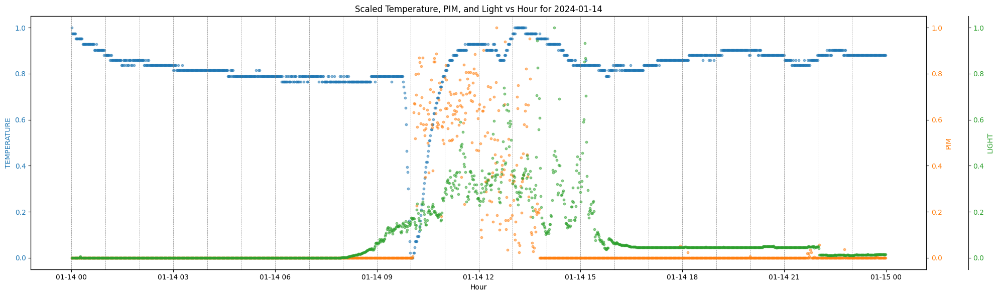

In [22]:
def remove_outliers(df, column):
    Q1 = df[column].quantile(0.01)
    Q3 = df[column].quantile(0.99)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]

def plot_day(df, day, scale='normalize'):
    # Filter data for the specified day
    day_start = pd.Timestamp(day)
    day_end = day_start + pd.Timedelta(days=1)
    day_data = df[(df['date_time'] >= day_start) & (df['date_time'] < day_end)]

    # Remove outliers
    day_data = remove_outliers(day_data, 'temperature')
    day_data = remove_outliers(day_data, 'pim')
    day_data = remove_outliers(day_data, 'light')

    # Extract unique hours
    unique_hours = day_data['date_time'].dt.floor('H').unique()

    # Scale data
    if scale == 'normalize':
        temp_max, temp_min = day_data['temperature'].max(), day_data['temperature'].min()
        pim_max, pim_min = day_data['pim'].max(), day_data['pim'].min()
        light_max, light_min = day_data['light'].max(), day_data['light'].min()
        
        day_data['temperature'] = (day_data['temperature'] - temp_min) / (temp_max - temp_min)
        day_data['pim'] = (day_data['pim'] - pim_min) / (pim_max - pim_min)
        day_data['light'] = (day_data['light'] - light_min) / (light_max - light_min)
    elif scale == 'standardize':
        temp_mean, temp_std = day_data['temperature'].mean(), day_data['temperature'].std()
        pim_mean, pim_std = day_data['pim'].mean(), day_data['pim'].std()
        light_mean, light_std = day_data['light'].mean(), day_data['light'].std()
        
        day_data['temperature'] = (day_data['temperature'] - temp_mean) / temp_std
        day_data['pim'] = (day_data['pim'] - pim_mean) / pim_std
        day_data['light'] = (day_data['light'] - light_mean) / light_std

    fig, ax1 = plt.subplots(figsize=(20, 6))

    color1 = 'tab:blue'
    ax1.set_xlabel('Hour')
    ax1.set_ylabel('TEMPERATURE', color=color1)
    ax1.scatter(day_data['date_time'], day_data['temperature'], s=10, alpha=0.5, color=color1)
    ax1.tick_params(axis='y', labelcolor=color1)
    ax1.set_title(f'Scaled Temperature, PIM, and Light vs Hour for {day}')
    for hour in unique_hours:
        ax1.axvline(hour, color='gray', linestyle='--', linewidth=0.5)

    ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
    color2 = 'tab:orange'
    ax2.set_ylabel('PIM', color=color2)
    ax2.scatter(day_data['date_time'], day_data['pim'], s=10, alpha=0.5, color=color2)
    ax2.tick_params(axis='y', labelcolor=color2)

    # Create a third y-axis for LIGHT
    ax3 = ax1.twinx()  # instantiate another axes that shares the same x-axis
    ax3.spines['right'].set_position(('outward', 60))  # move the spine outward by 60 points
    color3 = 'tab:green'
    ax3.set_ylabel('LIGHT', color=color3)
    ax3.scatter(day_data['date_time'], day_data['light'], s=10, alpha=0.5, color=color3)
    ax3.tick_params(axis='y', labelcolor=color3)

    fig.tight_layout()  # otherwise the right y-label is slightly clipped
    plt.show()

# Example usage
plot_day(data, '2024-01-14')


/var/folders/3t/mc9hl21152s0c3y6qfpzl90c0000gn/T/ipykernel_10026/2979729750.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  day_data['hour'] = day_data['date_time'].dt.hour + day_data['date_time'].dt.minute / 60
/var/folders/3t/mc9hl21152s0c3y6qfpzl90c0000gn/T/ipykernel_10026/2979729750.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  day_data['radian'] = (day_data['hour'] / 24) * 2 * np.pi


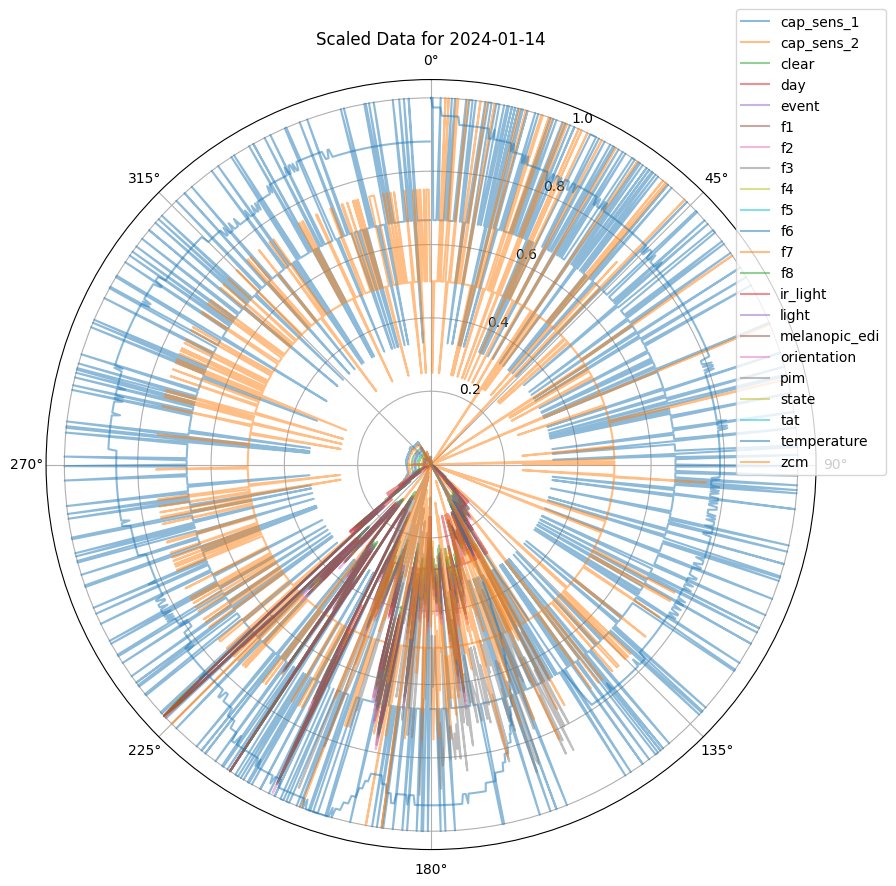

In [23]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

def remove_outliers(df, column):
    Q1 = df[column].quantile(0.01)
    Q3 = df[column].quantile(0.99)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]

def plot_all_columns(df, day, scale='normalize'):
    # Filter data for the specified day
    day_start = pd.Timestamp(day)
    day_end = day_start + pd.Timedelta(days=1)
    day_data = df[(df['date_time'] >= day_start) & (df['date_time'] < day_end)]

    # Convert date_time to hours and then to radians
    day_data['hour'] = day_data['date_time'].dt.hour + day_data['date_time'].dt.minute / 60
    day_data['radian'] = (day_data['hour'] / 24) * 2 * np.pi

    columns_to_plot = df.columns.difference(['date_time', 'hour', 'radian'])
    
    for column in columns_to_plot:
        day_data = remove_outliers(day_data, column)

        # Scale data
        if scale == 'normalize':
            col_max, col_min = day_data[column].max(), day_data[column].min()
            day_data[column] = (day_data[column] - col_min) / (col_max - col_min)
        elif scale == 'standardize':
            col_mean, col_std = day_data[column].mean(), day_data[column].std()
            day_data[column] = (day_data[column] - col_mean) / col_std

    fig, ax = plt.subplots(subplot_kw={'projection': 'polar'}, figsize=(10, 10))

    for column in columns_to_plot:
        ax.plot(day_data['radian'], day_data[column], label=column, alpha=0.5)

    ax.set_theta_direction(-1)  # Clockwise
    ax.set_theta_offset(np.pi / 2)  # Start at the top

    ax.set_title(f'Scaled Data for {day}')
    ax.legend(loc='upper right', bbox_to_anchor=(1.1, 1.1))

    plt.show()

# Example usage
plot_all_columns(data, '2024-01-14')


/var/folders/3t/mc9hl21152s0c3y6qfpzl90c0000gn/T/ipykernel_10026/1840916479.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  day_data['hour'] = day_data['date_time'].dt.hour + day_data['date_time'].dt.minute / 60
/var/folders/3t/mc9hl21152s0c3y6qfpzl90c0000gn/T/ipykernel_10026/1840916479.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  day_data['radian'] = (day_data['hour'] / 24) * 2 * np.pi


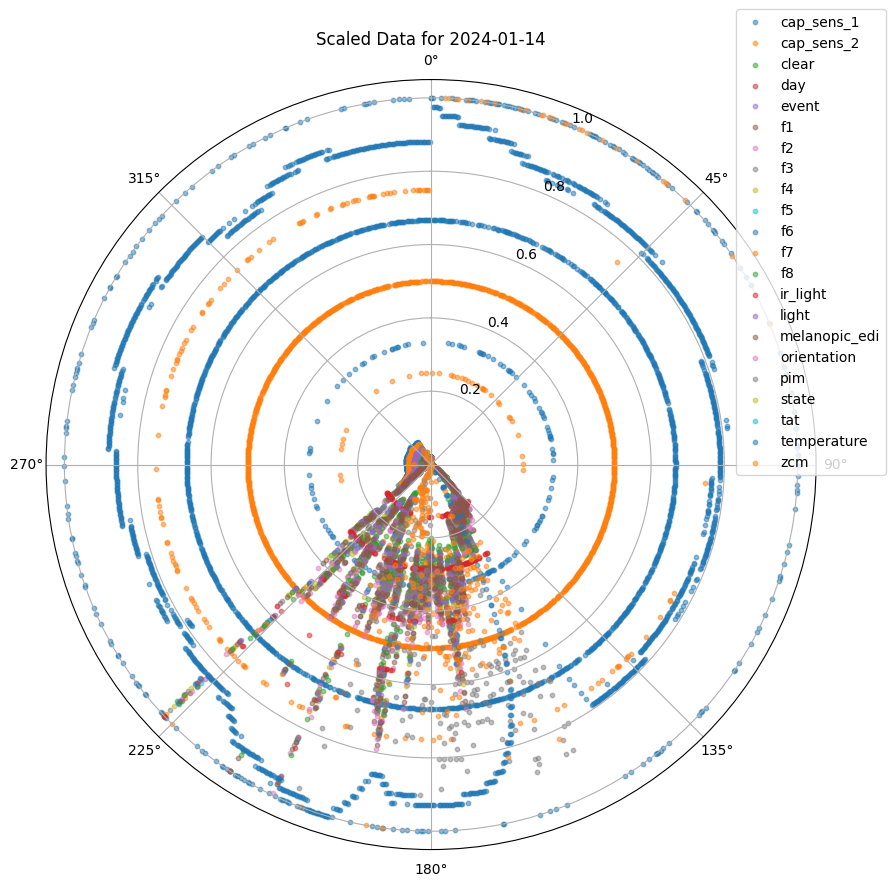

In [24]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

def remove_outliers(df, column):
    Q1 = df[column].quantile(0.01)
    Q3 = df[column].quantile(0.99)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]

def plot_all_columns(df, day, scale='normalize'):
    # Filter data for the specified day
    day_start = pd.Timestamp(day)
    day_end = day_start + pd.Timedelta(days=1)
    day_data = df[(df['date_time'] >= day_start) & (df['date_time'] < day_end)]

    # Convert date_time to hours and then to radians
    day_data['hour'] = day_data['date_time'].dt.hour + day_data['date_time'].dt.minute / 60
    day_data['radian'] = (day_data['hour'] / 24) * 2 * np.pi

    columns_to_plot = df.columns.difference(['date_time', 'hour', 'radian'])
    
    for column in columns_to_plot:
        day_data = remove_outliers(day_data, column)

        # Scale data
        if scale == 'normalize':
            col_max, col_min = day_data[column].max(), day_data[column].min()
            day_data[column] = (day_data[column] - col_min) / (col_max - col_min)
        elif scale == 'standardize':
            col_mean, col_std = day_data[column].mean(), day_data[column].std()
            day_data[column] = (day_data[column] - col_mean) / col_std

    fig, ax = plt.subplots(subplot_kw={'projection': 'polar'}, figsize=(10, 10))

    for column in columns_to_plot:
        ax.scatter(day_data['radian'], day_data[column], label=column, alpha=0.5, s=10)

    ax.set_theta_direction(-1)  # Clockwise
    ax.set_theta_offset(np.pi / 2)  # Start at the top

    ax.set_title(f'Scaled Data for {day}')
    ax.legend(loc='upper right', bbox_to_anchor=(1.1, 1.1))

    plt.show()

# Example usage
plot_all_columns(data, '2024-01-14')


/var/folders/3t/mc9hl21152s0c3y6qfpzl90c0000gn/T/ipykernel_10026/3560272422.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  day_data['hour'] = day_data['date_time'].dt.hour + day_data['date_time'].dt.minute / 60


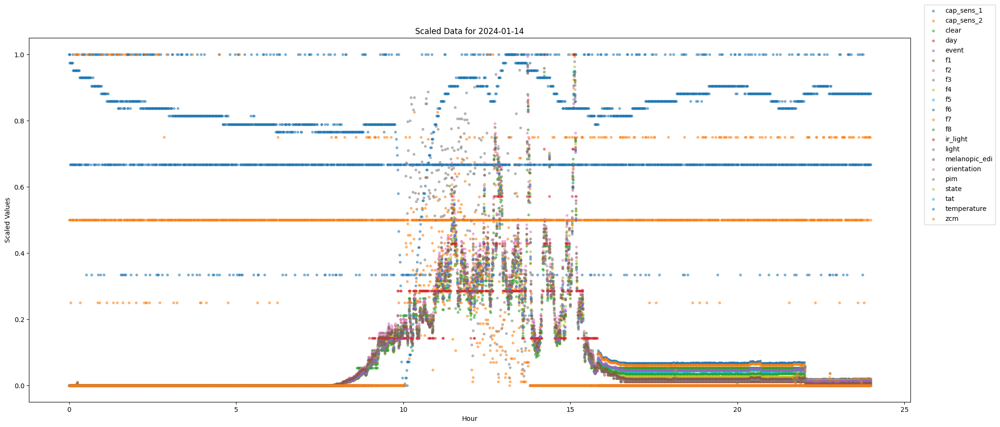

In [25]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

def remove_outliers(df, column):
    Q1 = df[column].quantile(0.01)
    Q3 = df[column].quantile(0.99)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]

def plot_all_columns(df, day, scale='normalize'):
    # Filter data for the specified day
    day_start = pd.Timestamp(day)
    day_end = day_start + pd.Timedelta(days=1)
    day_data = df[(df['date_time'] >= day_start) & (df['date_time'] < day_end)]

    # Convert date_time to hours
    day_data['hour'] = day_data['date_time'].dt.hour + day_data['date_time'].dt.minute / 60

    columns_to_plot = df.columns.difference(['date_time', 'hour'])
    
    fig, ax = plt.subplots(figsize=(24, 10))

    for column in columns_to_plot:
        day_data = remove_outliers(day_data, column)

        # Scale data
        if scale == 'normalize':
            col_max, col_min = day_data[column].max(), day_data[column].min()
            day_data[column] = (day_data[column] - col_min) / (col_max - col_min)
        elif scale == 'standardize':
            col_mean, col_std = day_data[column].mean(), day_data[column].std()
            day_data[column] = (day_data[column] - col_mean) / col_std

        ax.scatter(day_data['hour'], day_data[column], label=column, alpha=0.5, s=10)

    ax.set_xlabel('Hour')
    ax.set_ylabel('Scaled Values')
    ax.set_title(f'Scaled Data for {day}')
    ax.legend(loc='upper right', bbox_to_anchor=(1.1, 1.1))

    plt.show()

# Example usage
plot_all_columns(data, '2024-01-14')


/var/folders/3t/mc9hl21152s0c3y6qfpzl90c0000gn/T/ipykernel_10026/2809496944.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  day_data['hour'] = day_data['date_time'].dt.hour + day_data['date_time'].dt.minute / 60


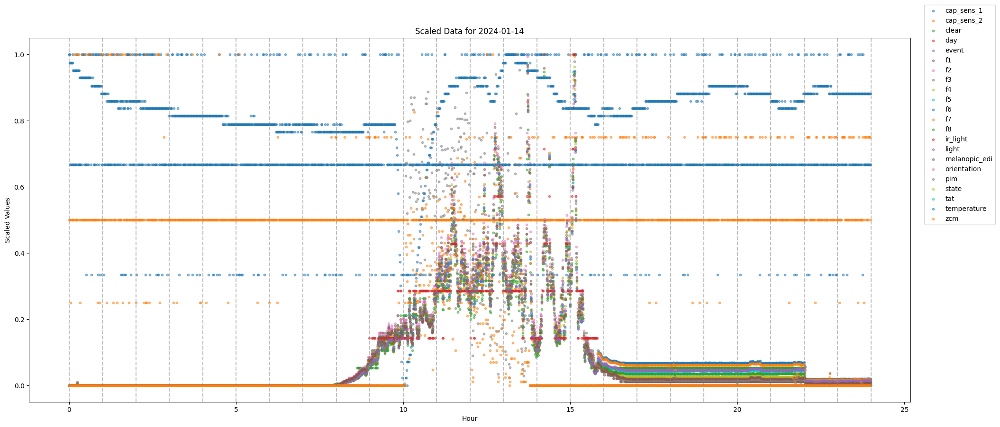

In [26]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

def remove_outliers(df, column):
    Q1 = df[column].quantile(0.01)
    Q3 = df[column].quantile(0.99)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]

def plot_all_columns(df, day, scale='normalize'):
    # Filter data for the specified day
    day_start = pd.Timestamp(day)
    day_end = day_start + pd.Timedelta(days=1)
    day_data = df[(df['date_time'] >= day_start) & (df['date_time'] < day_end)]

    # Convert date_time to hours
    day_data['hour'] = day_data['date_time'].dt.hour + day_data['date_time'].dt.minute / 60

    columns_to_plot = df.columns.difference(['date_time', 'hour'])
    
    fig, ax = plt.subplots(figsize=(24, 10))

    for column in columns_to_plot:
        day_data = remove_outliers(day_data, column)

        # Scale data
        if scale == 'normalize':
            col_max, col_min = day_data[column].max(), day_data[column].min()
            day_data[column] = (day_data[column] - col_min) / (col_max - col_min)
        elif scale == 'standardize':
            col_mean, col_std = day_data[column].mean(), day_data[column].std()
            day_data[column] = (day_data[column] - col_mean) / col_std

        ax.scatter(day_data['hour'], day_data[column], label=column, alpha=0.5, s=10)

    # Add vertical dashed lines for each hour
    for hour in range(25):  # From 0 to 24
        ax.axvline(x=hour, color='gray', linestyle='--', alpha=0.5)

    ax.set_xlabel('Hour')
    ax.set_ylabel('Scaled Values')
    ax.set_title(f'Scaled Data for {day}')
    ax.legend(loc='upper right', bbox_to_anchor=(1.1, 1.1))

    plt.show()

# Example usage
plot_all_columns(data, '2024-01-14')


/var/folders/3t/mc9hl21152s0c3y6qfpzl90c0000gn/T/ipykernel_10026/1887057325.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  day_data['hour'] = day_data['date_time'].dt.hour + day_data['date_time'].dt.minute / 60


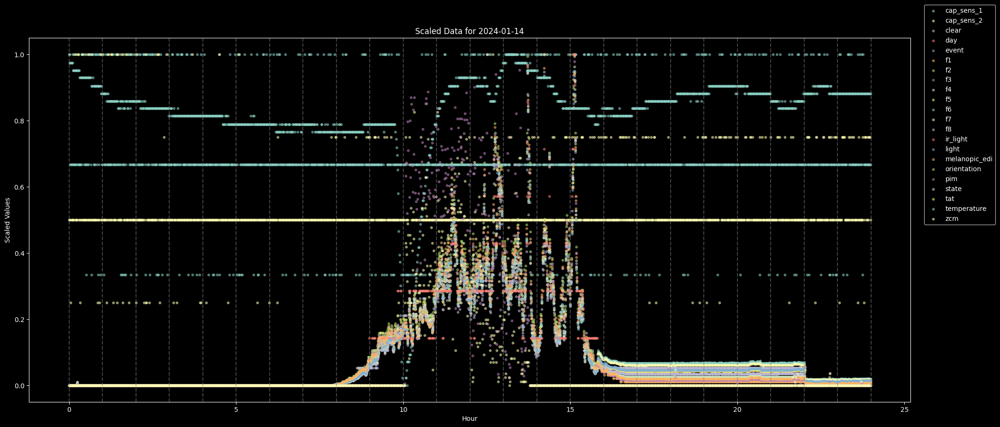

In [27]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

def remove_outliers(df, column):
    Q1 = df[column].quantile(0.01)
    Q3 = df[column].quantile(0.99)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]

def plot_all_columns(df, day, scale='normalize'):
    # Apply dark theme
    plt.style.use('dark_background')
    
    # Filter data for the specified day
    day_start = pd.Timestamp(day)
    day_end = day_start + pd.Timedelta(days=1)
    day_data = df[(df['date_time'] >= day_start) & (df['date_time'] < day_end)]

    # Convert date_time to hours
    day_data['hour'] = day_data['date_time'].dt.hour + day_data['date_time'].dt.minute / 60

    columns_to_plot = df.columns.difference(['date_time', 'hour'])
    
    fig, ax = plt.subplots(figsize=(24, 10))

    for column in columns_to_plot:
        day_data = remove_outliers(day_data, column)

        # Scale data
        if scale == 'normalize':
            col_max, col_min = day_data[column].max(), day_data[column].min()
            day_data[column] = (day_data[column] - col_min) / (col_max - col_min)
        elif scale == 'standardize':
            col_mean, col_std = day_data[column].mean(), day_data[column].std()
            day_data[column] = (day_data[column] - col_mean) / col_std

        ax.scatter(day_data['hour'], day_data[column], label=column, alpha=0.5, s=10)

    # Add vertical dashed lines for each hour
    for hour in range(25):  # From 0 to 24
        ax.axvline(x=hour, color='gray', linestyle='--', alpha=0.5)

    # Set labels and title to white
    ax.set_xlabel('Hour', color='white')
    ax.set_ylabel('Scaled Values', color='white')
    ax.set_title(f'Scaled Data for {day}', color='white')

    # Set tick labels to white
    ax.tick_params(axis='x', colors='white')
    ax.tick_params(axis='y', colors='white')

    # Set legend with white text
    legend = ax.legend(loc='upper right', bbox_to_anchor=(1.1, 1.1))
    for text in legend.get_texts():
        text.set_color('white')

    plt.show()

# Example usage
plot_all_columns(data, '2024-01-14')


/var/folders/3t/mc9hl21152s0c3y6qfpzl90c0000gn/T/ipykernel_10026/432337992.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  day_data['hour'] = day_data['date_time'].dt.hour + day_data['date_time'].dt.minute / 60
/var/folders/3t/mc9hl21152s0c3y6qfpzl90c0000gn/T/ipykernel_10026/432337992.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  day_data['hour'] = day_data['date_time'].dt.hour + day_data['date_time'].dt.minute / 60
/var/folders/3t/mc9hl21152s0c3y6qfpzl90c0000gn/T/ipykernel_10026/432337992.py:29

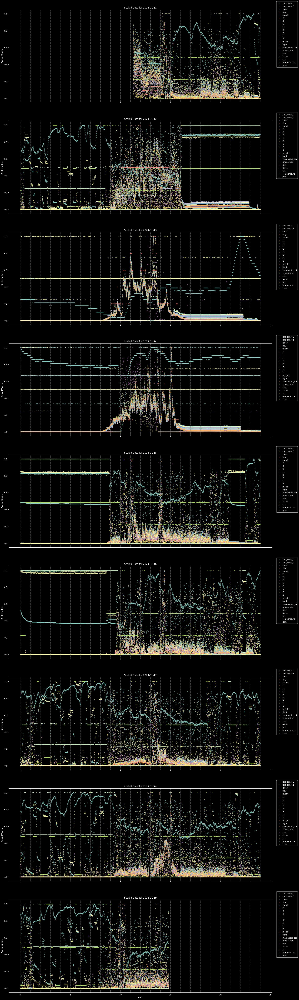

In [28]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

def remove_outliers(df, column):
    Q1 = df[column].quantile(0.01)
    Q3 = df[column].quantile(0.99)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]

def plot_all_columns(df, scale='normalize'):
    df['date'] = df['date_time'].dt.date
    unique_dates = df['date'].unique()
    num_days = len(unique_dates)
    
    fig, axs = plt.subplots(num_days, 1, figsize=(24, 10 * num_days), sharex=True)
    
    if num_days == 1:
        axs = [axs]
    
    for i, day in enumerate(unique_dates):
        day_start = pd.Timestamp(day)
        day_end = day_start + pd.Timedelta(days=1)
        day_data = df[(df['date_time'] >= day_start) & (df['date_time'] < day_end)]

        # Convert date_time to hours
        day_data['hour'] = day_data['date_time'].dt.hour + day_data['date_time'].dt.minute / 60

        columns_to_plot = df.columns.difference(['date_time', 'hour', 'date'])
        
        for column in columns_to_plot:
            day_data = remove_outliers(day_data, column)

            # Scale data
            if scale == 'normalize':
                col_max, col_min = day_data[column].max(), day_data[column].min()
                day_data[column] = (day_data[column] - col_min) / (col_max - col_min)
            elif scale == 'standardize':
                col_mean, col_std = day_data[column].mean(), day_data[column].std()
                day_data[column] = (day_data[column] - col_mean) / col_std

            axs[i].scatter(day_data['hour'], day_data[column], label=column, alpha=0.5, s=10)

        # Add vertical dashed lines for each hour
        for hour in range(25):  # From 0 to 24
            axs[i].axvline(x=hour, color='gray', linestyle='--', alpha=0.5)

        axs[i].set_ylabel('Scaled Values')
        axs[i].set_title(f'Scaled Data for {day}')
        axs[i].legend(loc='upper right', bbox_to_anchor=(1.1, 1.1))
    
    axs[-1].set_xlabel('Hour')
    plt.show()

# Example usage
plot_all_columns(data)


## Interactive plot to identifiy factors with minmum changes over the time period

In [29]:
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go

def remove_outliers(df, column):
    Q1 = df[column].quantile(0.01)
    Q3 = df[column].quantile(0.99)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]

def plot_all_columns(df, day, scale='normalize'):
    # Filter data for the specified day
    day_start = pd.Timestamp(day)
    day_end = day_start + pd.Timedelta(days=1)
    day_data = df[(df['date_time'] >= day_start) & (df['date_time'] < day_end)]

    # Convert date_time to hours
    day_data['hour'] = day_data['date_time'].dt.hour + day_data['date_time'].dt.minute / 60

    columns_to_plot = df.columns.difference(['date_time', 'hour'])

    fig = go.Figure()

    for column in columns_to_plot:
        day_data = remove_outliers(day_data, column)

        # Scale data
        if scale == 'normalize':
            col_max, col_min = day_data[column].max(), day_data[column].min()
            if col_max != col_min:  # Avoid division by zero
                day_data[column] = (day_data[column] - col_min) / (col_max - col_min)
            else:
                day_data[column] = 0  # Assign a constant value if no variation

        elif scale == 'standardize':
            col_mean, col_std = day_data[column].mean(), day_data[column].std()
            if col_std != 0:  # Avoid division by zero
                day_data[column] = (day_data[column] - col_mean) / col_std
            else:
                day_data[column] = 0  # Assign a constant value if no variation

        fig.add_trace(go.Scatter(
            x=day_data['hour'],
            y=day_data[column],
            mode='markers',
            name=column,
            opacity=0.5,
            marker=dict(size=4)
        ))

    # Add vertical dashed lines for each hour
    for hour in range(25):  # From 0 to 24
        fig.add_vline(x=hour, line=dict(color='gray', dash='dash'), opacity=0.5)

    fig.update_layout(
        title=f'Scaled Data for {day}',
        xaxis_title='Hour',
        yaxis_title='Scaled Values',
        legend_title='Columns',
        legend=dict(x=1.1, y=1.1)
    )

    fig.show()

# Example usage
# Assuming 'data' is a DataFrame with the necessary structure
plot_all_columns(data, '2024-01-14')


/var/folders/3t/mc9hl21152s0c3y6qfpzl90c0000gn/T/ipykernel_10026/463757582.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  day_data['hour'] = day_data['date_time'].dt.hour + day_data['date_time'].dt.minute / 60


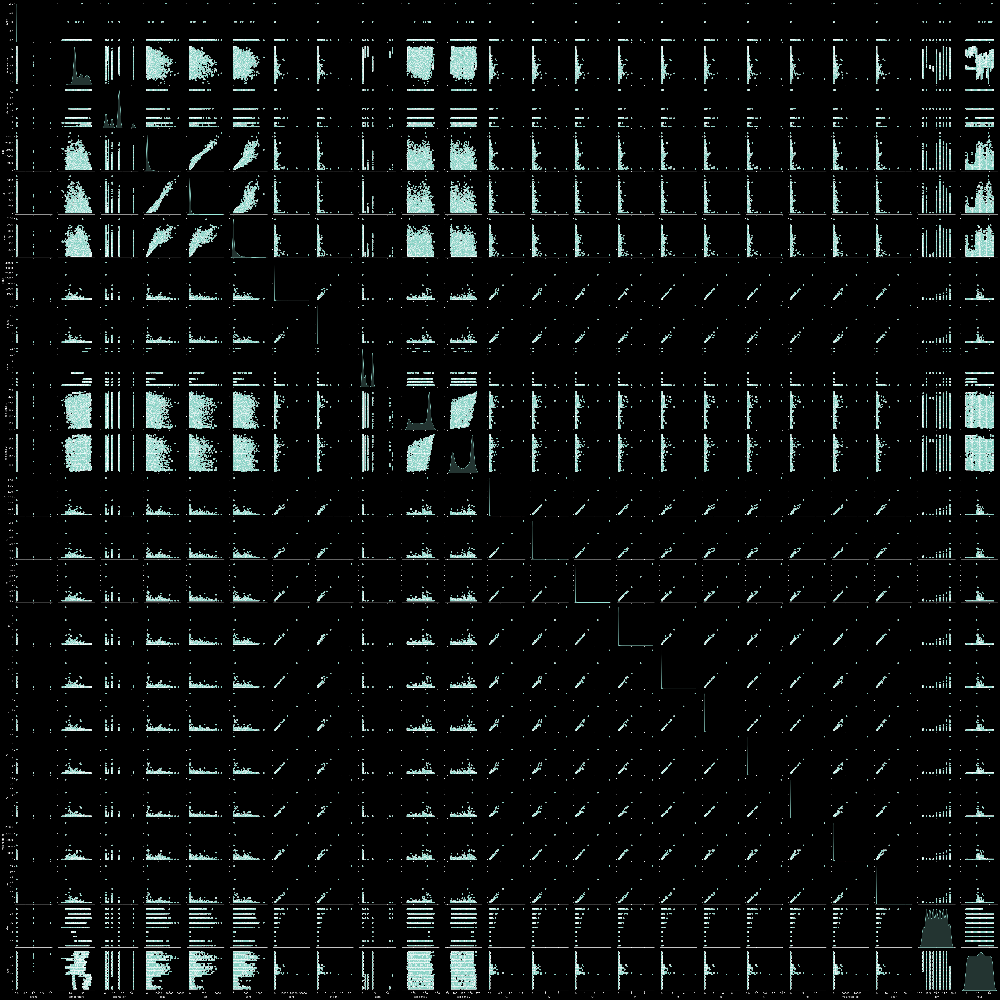

In [30]:
sns.pairplot(data, diag_kind='kde')

## visulaizing by column number

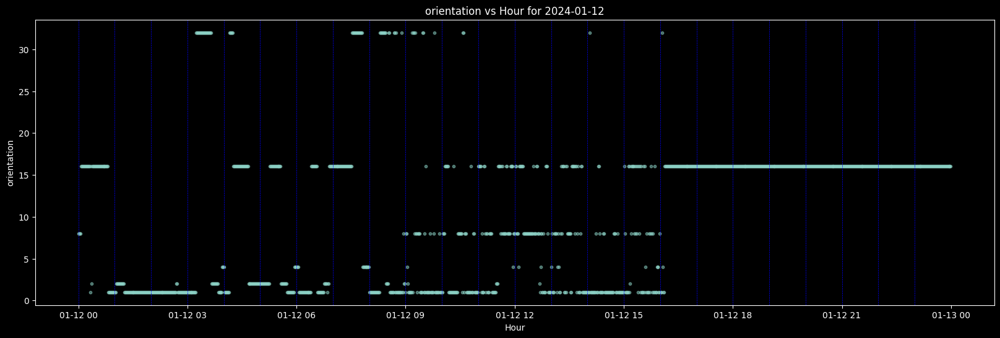

In [31]:
import pandas as pd
import matplotlib.pyplot as plt

def plot_day(df, day, col_num):
    # Ensure col_num is within the valid range
    if col_num < 0 or col_num >= df.shape[1]:
        raise ValueError("Column number is out of range")

    # Filter data for the specified day
    day_start = pd.Timestamp(day)
    day_end = day_start + pd.Timedelta(days=1)
    day_data = df[(df['date_time'] >= day_start) & (df['date_time'] < day_end)]

    # Extract unique hours
    unique_hours = day_data['date_time'].dt.floor('H').unique()

    # Get column name by index
    column_name = df.columns[col_num]

    plt.figure(figsize=(20, 6))
    # Plot by date_time and selected column
    plt.scatter(day_data['date_time'], day_data.iloc[:, col_num], s=10, alpha=0.5)

    # Add vertical dashed lines for each unique hour
    for hour in unique_hours:
        plt.axvline(hour, color='b', linestyle='--', linewidth=0.5)

    plt.xlabel('Hour')
    plt.ylabel(column_name)
    plt.title(f'{column_name} vs Hour for {day}')
    plt.show()

# Example usage
# Assuming 'data' is your DataFrame and you want to plot the 3rd column (index 2)
plot_day(data, '2024-01-12', 3)


## visulaizing by column number

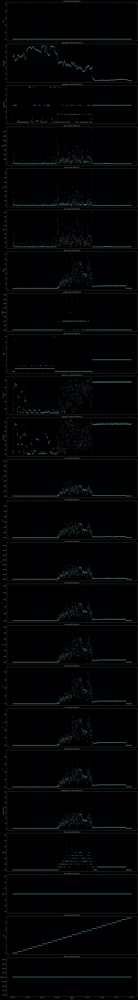

In [32]:
import pandas as pd
import matplotlib.pyplot as plt

def plot_day(df, day):
    # Filter data for the specified day
    day_start = pd.Timestamp(day)
    day_end = day_start + pd.Timedelta(days=1)
    day_data = df[(df['date_time'] >= day_start) & (df['date_time'] < day_end)]

    # Extract unique hours
    unique_hours = day_data['date_time'].dt.floor('H').unique()

    # Determine the number of columns (excluding the 'date_time' column)
    num_cols = df.shape[1] - 1

    # Create subplots (one column and num_cols rows)
    fig, axes = plt.subplots(num_cols, 1, figsize=(20, num_cols * 6), sharex=True)

    # Plot each column in a separate subplot
    for i, col in enumerate(df.columns):
        if col == 'date_time':
            continue
        ax = axes[i-1]  # Adjust index to account for the 'date_time' column
        ax.scatter(day_data['date_time'], day_data[col], s=10, alpha=0.5)
        
        # Add vertical dashed lines for each unique hour
        for hour in unique_hours:
            ax.axvline(hour, color='b', linestyle='--', linewidth=0.5)
        
        ax.set_ylabel(col)
        ax.set_title(f'{col} vs Hour for {day}')

    plt.xlabel('Hour')
    plt.tight_layout()
    plt.show()

# Example usage
# Assuming 'data' is your DataFrame with a 'date_time' column
plot_day(data, '2024-01-12')


## Main representatives

'temperature'
'orientation'
'pim'
'light'
'ir_light'
'state'
'cap_sens_1'
'melanopic_edi'
'clear'

In [33]:
# Define the columns to keep
columns_to_keep = [
    'date_time',
    'temperature',
    'orientation',
    'pim',
    'light',
    'ir_light',
    'state',
    'cap_sens_1',
    'melanopic_edi',
    'clear'
]

# Creating the sub-dataframe with the specified columns
sub_df = data[columns_to_keep]

# Display the sub-dataframe
print(sub_df)


                date_time  temperature  orientation   pim   light  ir_light   
0     2024-01-11 11:17:39        22.50           16  5964  245.18      0.04  \
1     2024-01-11 11:18:39        24.06            8  2288  583.68      0.13   
2     2024-01-11 11:19:39        24.69           16  2600  568.48      0.12   
3     2024-01-11 11:20:39        25.12            8  2543  511.51      0.11   
4     2024-01-11 11:21:39        25.31           16  1170  524.02      0.11   
...                   ...          ...          ...   ...     ...       ...   
11729 2024-01-19 14:46:39        26.75            8  1680  469.54      0.11   
11730 2024-01-19 14:47:39        26.75            1  1519  289.31      0.06   
11731 2024-01-19 14:48:39        24.88           16  4685  165.01      0.04   
11732 2024-01-19 14:49:39        23.62           16     0  196.72      0.04   
11733 2024-01-19 14:50:39        22.81           16  2552  146.93      0.03   

       state  cap_sens_1  melanopic_edi  clear  
0 

## 10 min intervals mean

### I can use also Max

In [34]:
import pandas as pd

# Assuming your sub-dataframe is named sub_df
# Ensure the 'date_time' column is in datetime format
sub_df['date_time'] = pd.to_datetime(sub_df['date_time'])

# Set the 'date_time' column as the index
sub_df.set_index('date_time', inplace=True)

# Resample the dataframe in 10-minute intervals and calculate the mean for each interval
resampled_df = sub_df.resample('10T').mean()

# Reset the index to bring 'date_time' back as a column
resampled_df.reset_index(inplace=True)

# Display the resampled dataframe
print(resampled_df)


               date_time  temperature  orientation          pim    light   
0    2024-01-11 11:10:00       23.750    13.333333  3617.333333  465.780  \
1    2024-01-11 11:20:00       26.087     9.700000  3152.100000  427.053   
2    2024-01-11 11:30:00       26.426    10.400000  2960.200000  373.556   
3    2024-01-11 11:40:00       26.129     8.000000  1352.700000  386.749   
4    2024-01-11 11:50:00       26.199    12.800000  1555.200000  388.046   
...                  ...          ...          ...          ...      ...   
1170 2024-01-19 14:10:00       24.713     7.300000  3461.300000  416.889   
1171 2024-01-19 14:20:00       25.643    10.400000  2866.100000  375.052   
1172 2024-01-19 14:30:00       26.633     5.800000  5090.400000  449.305   
1173 2024-01-19 14:40:00       26.313    12.900000  1588.000000  339.234   
1174 2024-01-19 14:50:00       22.810    16.000000  2552.000000  146.930   

      ir_light  state  cap_sens_1  melanopic_edi  clear  
0     0.096667    0.0  162.66

/var/folders/3t/mc9hl21152s0c3y6qfpzl90c0000gn/T/ipykernel_10026/3031664979.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



## k-mean

/Users/probio/Documents/codes/ds-pandas-numpy/.venv/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/Users/probio/Documents/codes/ds-pandas-numpy/.venv/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/Users/probio/Documents/codes/ds-pandas-numpy/.venv/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/Users/probio/Documents/codes/ds-pandas-numpy/.venv/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` 

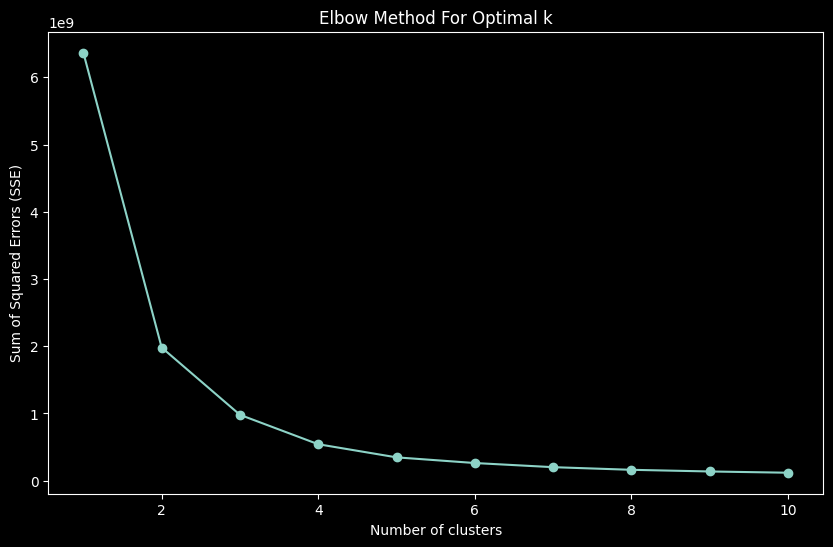

/Users/probio/Documents/codes/ds-pandas-numpy/.venv/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



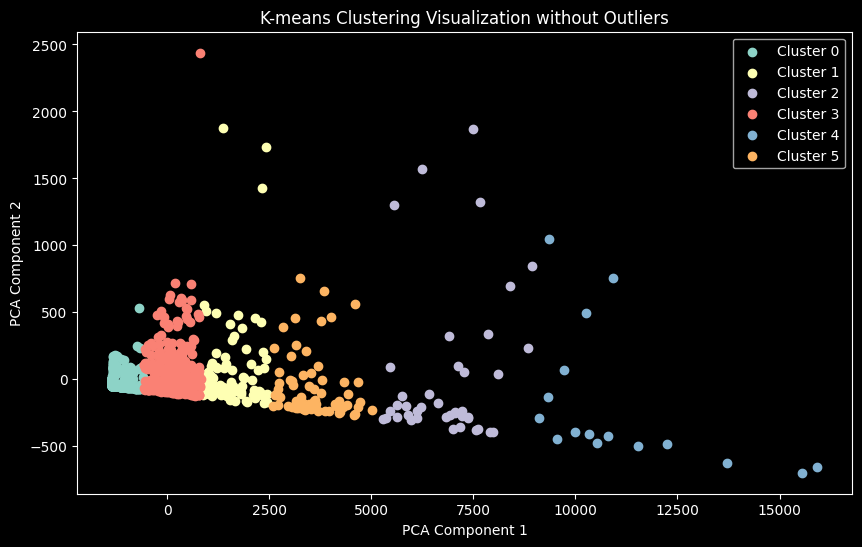

In [35]:
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Assuming your resampled dataframe is named resampled_df
# Ensure the 'date_time' column is not used in clustering
data_for_clustering = resampled_df.drop(columns=['date_time'])

# Function to remove outliers using the IQR method
def remove_outliers(df):
    Q1 = df.quantile(0.00)
    Q3 = df.quantile(0.99)
    IQR = Q3 - Q1
    mask = ~((df < (Q1 - 1.5 * IQR)) | (df > (Q3 + 1.5 * IQR))).any(axis=1)
    return df[mask]

# Remove outliers from the data
data_without_outliers = remove_outliers(data_for_clustering)

# Determine the optimal number of clusters using the elbow method
sse = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(data_without_outliers)
    sse.append(kmeans.inertia_)

# Plot the SSE for each k to find the elbow point
plt.figure(figsize=(10, 6))
plt.plot(range(1, 11), sse, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Sum of Squared Errors (SSE)')
plt.title('Elbow Method For Optimal k')
plt.show()

# Let's assume the optimal number of clusters is determined to be 3 (replace this with your actual optimal number)
optimal_clusters = 6

# Apply K-means clustering with the optimal number of clusters
kmeans = KMeans(n_clusters=optimal_clusters, random_state=42)
clusters = kmeans.fit_predict(data_without_outliers)

# Add the cluster labels to the resampled dataframe
resampled_df_cleaned = resampled_df.loc[data_without_outliers.index]
resampled_df_cleaned['cluster'] = clusters

# Visualize the clusters using PCA for dimensionality reduction
pca = PCA(n_components=2)
pca_components = pca.fit_transform(data_without_outliers)

plt.figure(figsize=(10, 6))
for cluster in range(optimal_clusters):
    plt.scatter(pca_components[clusters == cluster, 0], pca_components[clusters == cluster, 1], label=f'Cluster {cluster}')

plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.title('K-means Clustering Visualization without Outliers')
plt.legend()
plt.show()


## Gaussian Mixture Model (GMM) for clustering

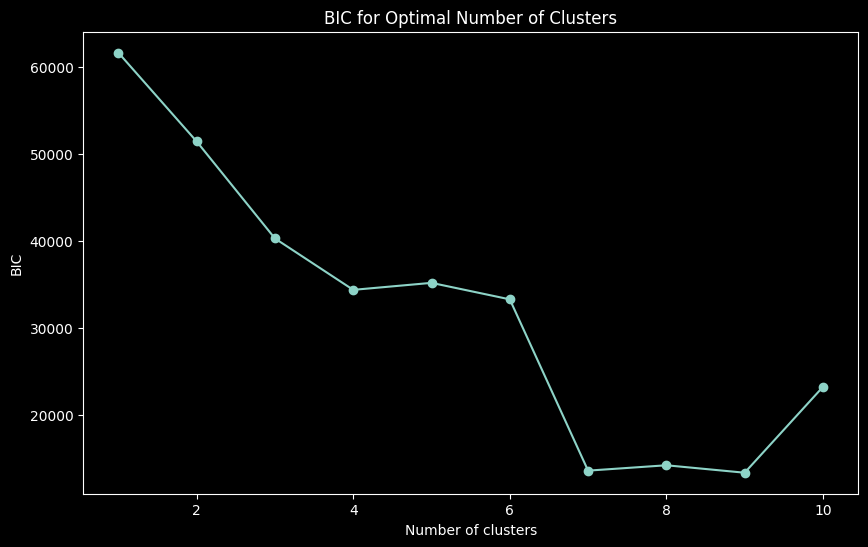

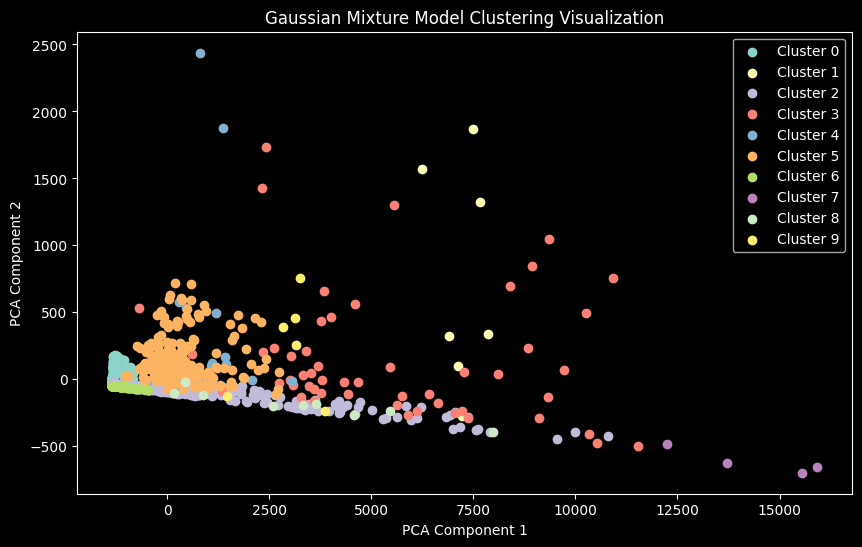

In [36]:
import pandas as pd
from sklearn.mixture import GaussianMixture
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Assuming your resampled dataframe is named resampled_df
# Ensure the 'date_time' column is not used in clustering
data_for_clustering = resampled_df.drop(columns=['date_time'])

# Function to remove outliers using the IQR method
def remove_outliers(df):
    Q1 = df.quantile(0.00)
    Q3 = df.quantile(0.99)
    IQR = Q3 - Q1
    mask = ~((df < (Q1 - 1.5 * IQR)) | (df > (Q3 + 1.5 * IQR))).any(axis=1)
    return df[mask]

# Remove outliers from the data
data_without_outliers = remove_outliers(data_for_clustering)

# Apply PCA to reduce dimensions for visualization
pca = PCA(n_components=2)
pca_components = pca.fit_transform(data_without_outliers)

# Determine the optimal number of clusters using the BIC (Bayesian Information Criterion)
n_components = range(1, 11)
models = [GaussianMixture(n, covariance_type='full', random_state=42).fit(data_without_outliers) for n in n_components]
bics = [model.bic(data_without_outliers) for model in models]

# Plot the BIC scores to find the optimal number of clusters
plt.figure(figsize=(10, 6))
plt.plot(n_components, bics, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('BIC')
plt.title('BIC for Optimal Number of Clusters')
plt.show()

# Let's assume the optimal number of clusters is determined to be 3 (replace this with your actual optimal number)
optimal_clusters = 10

# Apply Gaussian Mixture Model with the optimal number of clusters
gmm = GaussianMixture(n_components=optimal_clusters, covariance_type='full', random_state=42)
gmm.fit(data_without_outliers)
clusters = gmm.predict(data_without_outliers)

# Add the cluster labels to the resampled dataframe
resampled_df_cleaned = resampled_df.loc[data_without_outliers.index]
resampled_df_cleaned['cluster'] = clusters

# Visualize the clusters using PCA for dimensionality reduction
plt.figure(figsize=(10, 6))
for cluster in range(optimal_clusters):
    plt.scatter(pca_components[clusters == cluster, 0], pca_components[clusters == cluster, 1], label=f'Cluster {cluster}')

plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.title('Gaussian Mixture Model Clustering Visualization')
plt.legend()
plt.show()


/var/folders/3t/mc9hl21152s0c3y6qfpzl90c0000gn/T/ipykernel_10026/1759995728.py:23: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/3t/mc9hl21152s0c3y6qfpzl90c0000gn/T/ipykernel_10026/1759995728.py:31: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



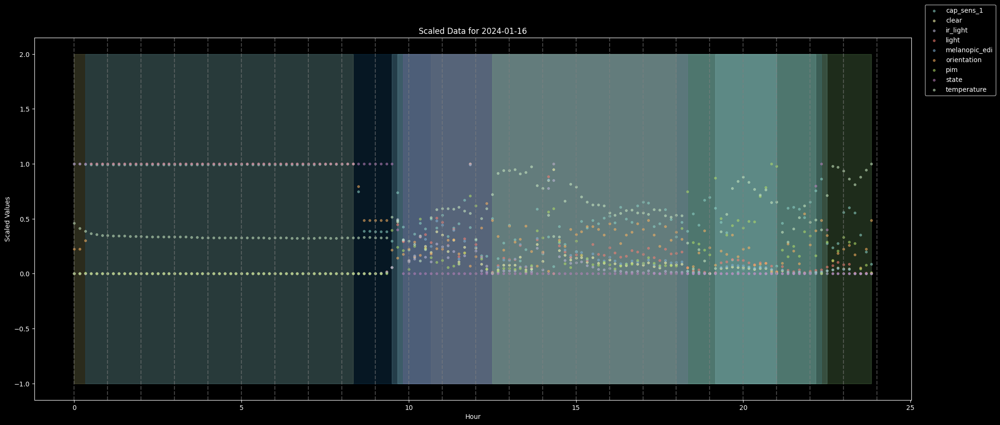

In [37]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

def remove_outliers(df, column):
    Q1 = df[column].quantile(0.01)
    Q3 = df[column].quantile(0.99)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]

def plot_all_columns(df, day, scale='normalize'):
    # Apply dark theme
    plt.style.use('dark_background')
    
    # Filter data for the specified day
    day_start = pd.Timestamp(day)
    day_end = day_start + pd.Timedelta(days=1)
    day_data = df[(df['date_time'] >= day_start) & (df['date_time'] < day_end)]

    # Convert date_time to hours
    day_data['hour'] = day_data['date_time'].dt.hour + day_data['date_time'].dt.minute / 60

    columns_to_plot = df.columns.difference(['date_time', 'hour', 'cluster'])
    
    fig, ax = plt.subplots(figsize=(24, 10))

    # Background color for clusters
    unique_clusters = day_data['cluster'].unique()
    colors = plt.cm.get_cmap('tab20', len(unique_clusters))

    for cluster in unique_clusters:
        cluster_data = day_data[day_data['cluster'] == cluster]
        ax.fill_betweenx(y=[-1, 2], x1=cluster_data['hour'].min(), x2=cluster_data['hour'].max(),
                         color=colors(cluster), alpha=0.2)

    for column in columns_to_plot:
        day_data = remove_outliers(day_data, column)

        # Scale data
        if scale == 'normalize':
            col_max, col_min = day_data[column].max(), day_data[column].min()
            day_data[column] = (day_data[column] - col_min) / (col_max - col_min)
        elif scale == 'standardize':
            col_mean, col_std = day_data[column].mean(), day_data[column].std()
            day_data[column] = (day_data[column] - col_mean) / col_std

        ax.scatter(day_data['hour'], day_data[column], label=column, alpha=0.5, s=10)

    # Add vertical dashed lines for each hour
    for hour in range(25):  # From 0 to 24
        ax.axvline(x=hour, color='gray', linestyle='--', alpha=0.5)

    # Set labels and title to white
    ax.set_xlabel('Hour', color='white')
    ax.set_ylabel('Scaled Values', color='white')
    ax.set_title(f'Scaled Data for {day}', color='white')

    # Set tick labels to white
    ax.tick_params(axis='x', colors='white')
    ax.tick_params(axis='y', colors='white')

    # Set legend with white text
    legend = ax.legend(loc='upper right', bbox_to_anchor=(1.1, 1.1))
    for text in legend.get_texts():
        text.set_color('white')

    plt.show()

# Example usage, assuming your data with clusters is named 'resampled_df_cleaned'
plot_all_columns(resampled_df_cleaned, '2024-01-16')





## columns with high correlations

In [38]:
# pim, tat and zcm
subset_1 = data[['pim', 'tat', 'zcm']]

# f1-8 and melanopic-edi

subset_2 = data[['f1', 'f2', 'f3', 'f4', 'f5', 'f6', 'f7', 'f8', 'melanopic_edi']]

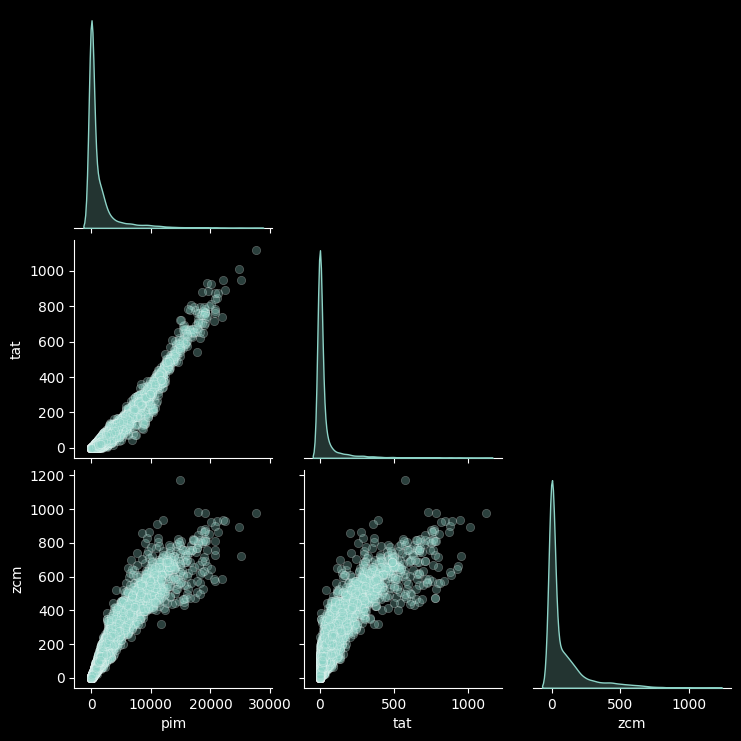

In [48]:
# pairplot for subset_1
sns.pairplot(subset_1, diag_kind='kde', plot_kws={'alpha': 0.3}, height=2.5, corner=True)

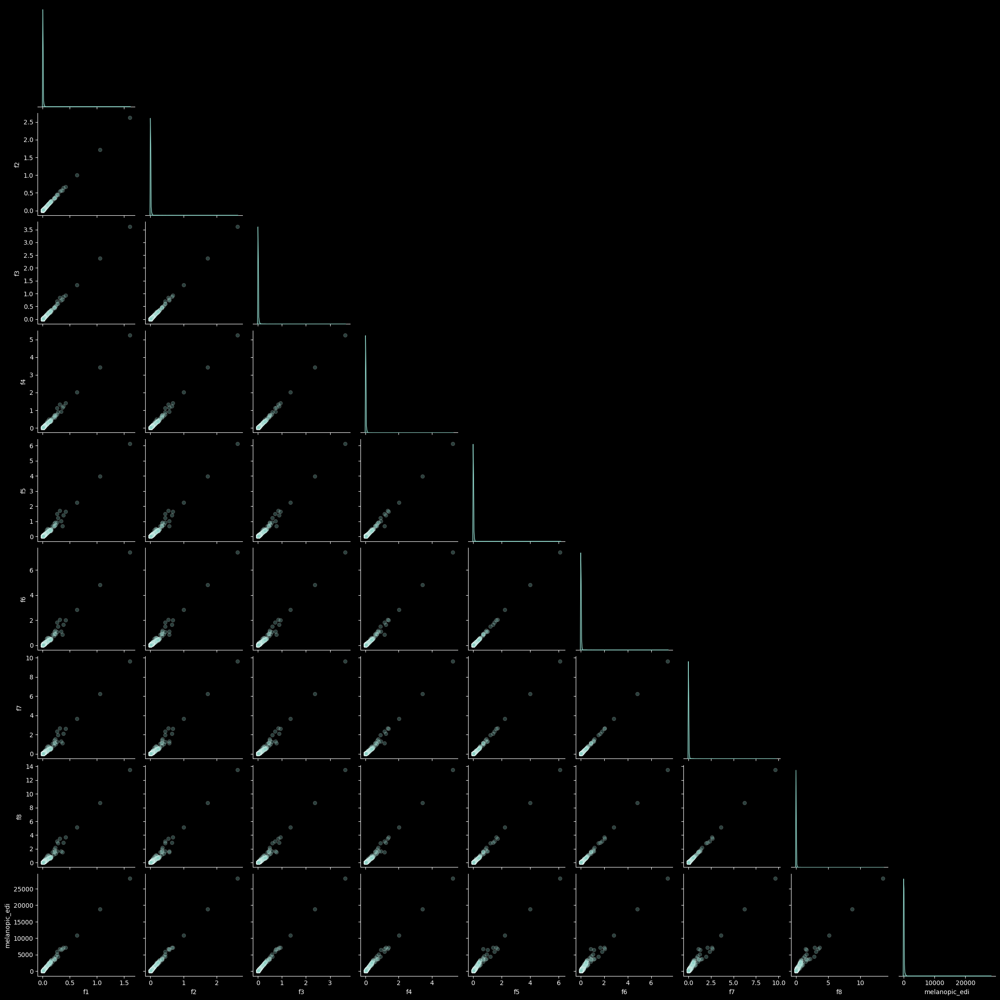

In [47]:
# pairplot for subset_2

sns.pairplot(subset_2, diag_kind='kde', plot_kws={'alpha': 0.3}, height=2.5, corner=True)